In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import h3
import geopandas as gpd
import folium
from shapely.geometry import Polygon
from branca.colormap import linear

import glob
import warnings

pd.set_option('display.max_columns', None)
warnings.filterwarnings("ignore")

In [4]:
csv_files = glob.glob("sample_dataset/*.csv")
csv_files

['sample_dataset/sample_dataset_demographics.csv',
 'sample_dataset/sample_dataset_location.csv',
 'sample_dataset/sample_dataset_population.csv',
 'sample_dataset/us_zip_codes.csv',
 'sample_dataset/sample_dataset_status.csv',
 'sample_dataset/sample_dataset_services.csv']

In [5]:
demographics_df = pd.read_csv("sample_dataset/sample_dataset_demographics.csv")
location_df = pd.read_csv("sample_dataset/sample_dataset_location.csv")
population_df = pd.read_csv("sample_dataset/sample_dataset_population.csv")
status_df = pd.read_csv("sample_dataset/sample_dataset_status.csv")
services_df = pd.read_csv("sample_dataset/sample_dataset_services.csv")

In [6]:
population_df['Population'] = pd.to_numeric(population_df['Population'], errors='coerce') 

In [7]:
population_df.dtypes

Zip Code        int64
Population    float64
dtype: object

### 1. Merging the various individual dataframes into a single dataframe

In [9]:
customer_df = demographics_df.merge(services_df, on='Customer ID', how='left')\
                             .merge(location_df, on='Customer ID', how='left')\
                             .merge(status_df, on='Customer ID', how='left') 

In [10]:
customer_df.head()

,Customer ID,Gender,Age,Married,Dependents,Number of Dependents,Referred a Friend,Number of Referrals,Tenure in Months,Offer,Home Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Internet Type,Avg Monthly GB Download,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,State,City,Zip Code,Latitude,Longitude,Satisfaction Score,Customer Status,Churn Value,Churn Category,Churn Reason
0,1608-GMEWB,Male,76,No,No,0,No,0,45,Offer B,Yes,15.65,Yes,Yes,Fiber Optic,18,No,No,No,No,Yes,Yes,No,Yes,Two Year,Yes,Bank Withdrawal,93.9,4200.25,0.0,0,704.25,4904.50,California,Stockton,95215,37.946282,-121.139499,4,Stayed,0,NaN,NaN
1,2817-LVCPP,Female,36,No,No,0,No,0,50,NaN,Yes,12.62,No,No,NaN,0,No,No,No,No,No,No,No,No,Two Year,No,Credit Card,19.4,1023.95,0.0,0,631.00,1654.95,California,Sacramento,95822,38.512569,-121.495184,5,Stayed,0,NaN,NaN
2,0997-YTLNY,Female,59,No,Yes,2,No,0,19,Offer D,Yes,4.03,No,Yes,Cable,26,No,No,No,Yes,No,No,No,Yes,Month-to-Month,No,Credit Card,48.8,953.65,0.0,0,76.57,1030.22,California,Escondido,92029,33.079834,-117.134275,3,Stayed,0,NaN,NaN
3,0526-SXDJP,Male,36,Yes,No,0,Yes,7,72,Offer A,No,0.00,No,Yes,Cable,17,Yes,Yes,Yes,No,No,No,No,Yes,Two Year,No,Bank Withdrawal,42.1,2962.00,0.0,0,0.00,2962.00,California,Bell,90201,33.970343,-118.171368,4,Stayed,0,NaN,NaN
4,3466-RITXD,Male,34,No,No,0,No,0,26,NaN,Yes,37.59,Yes,Yes,Fiber Optic,8,Yes,Yes,No,No,Yes,No,No,Yes,Month-to-Month,Yes,Credit Card,92.4,2349.80,0.0,0,977.34,3327.14,California,Twin Bridges,95735,38.805481,-120.132870,3,Stayed,0,NaN,NaN


### 2. Compute market share per zip code using the population and subscriber count

In [12]:
customer_df['Customer Status'].value_counts()

Customer Status
Stayed     4720
Churned    1869
Joined      454
Name: count, dtype: int64

In [13]:
current_customers = customer_df[customer_df['Customer Status'] != 'Churned'].groupby('Zip Code')['Customer ID'].count().reset_index(name='Customer Count')

In [14]:
customer_market_share = current_customers.merge(population_df, on='Zip Code', how='left')

In [15]:
customer_total = customer_df[customer_df['Customer Status'] != 'Churned']['Customer ID'].count()

In [16]:
customer_total

5174

In [17]:
customer_market_share['Market Share (% of Population)'] = customer_market_share['Customer Count'] / customer_market_share['Population'] * 100

In [18]:
customer_market_share['Customer Share (% of Total Customers)'] = customer_market_share['Customer Count'] / customer_total * 100

In [19]:
market_share_df = customer_market_share[['Zip Code', 'Market Share (% of Population)', 'Customer Share (% of Total Customers)']].reset_index(drop=True)

In [20]:
market_share_df['Market Share (% of Population)'] = market_share_df['Market Share (% of Population)'].fillna(0)
market_share_df['Customer Share (% of Total Customers)'] = market_share_df['Customer Share (% of Total Customers)'].fillna(0)

In [21]:
market_share_df.sort_values(by='Market Share (% of Population)', ascending=False).head()

,Zip Code,Market Share (% of Population),Customer Share (% of Total Customers)
82,90263,36.363636,0.077310
1406,95735,16.000000,0.077310
1130,95225,14.814815,0.077310
1497,95978,14.285714,0.077310
59,90071,14.285714,0.057982


### 3. Analyze churn and market share as a function of metrics such as age, average monthly GB download

In [23]:
customer_df = customer_df.merge(market_share_df, on='Zip Code', how='left')

In [24]:
customer_df['Market Share (% of Population)'] = customer_df['Market Share (% of Population)'].fillna(0)
customer_df['Customer Share (% of Total Customers)'] = customer_df['Customer Share (% of Total Customers)'].fillna(0)

In [25]:
# Visualize the relationship between continuous features and the Churn Value

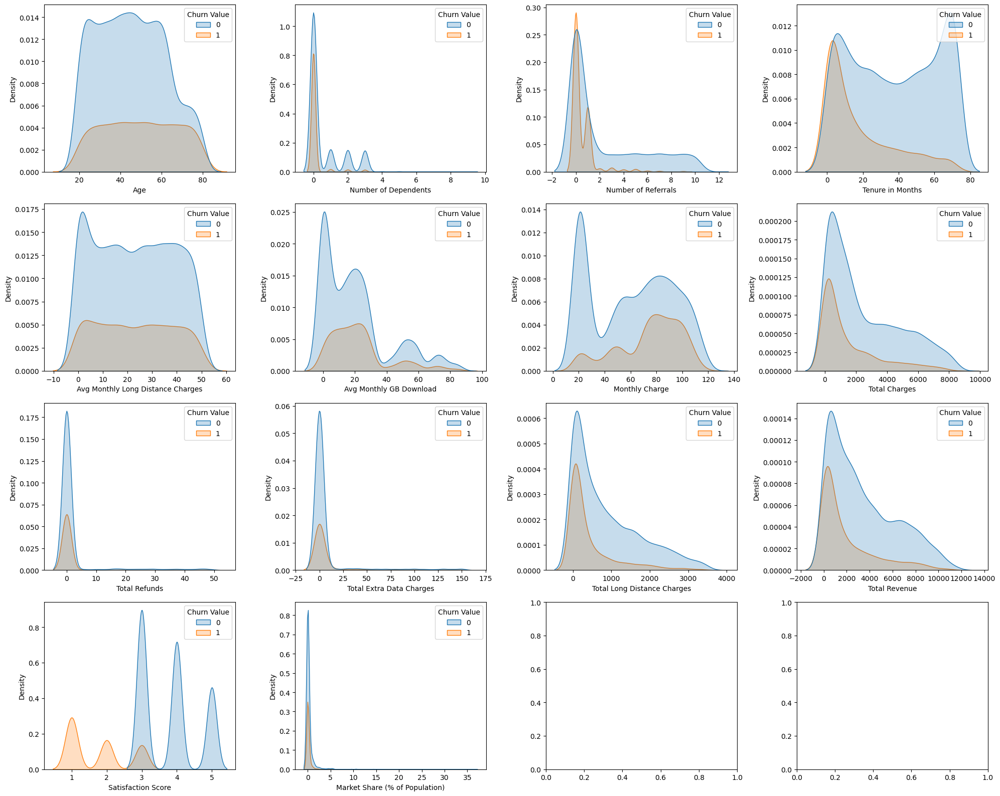

In [26]:
# List of features to plot 
features = ['Age', 'Number of Dependents', 'Number of Referrals',
       'Tenure in Months', 'Avg Monthly Long Distance Charges',
       'Avg Monthly GB Download', 'Monthly Charge', 'Total Charges',
       'Total Refunds', 'Total Extra Data Charges',
       'Total Long Distance Charges', 'Total Revenue', 'Satisfaction Score', 'Market Share (% of Population)']

# Number of rows and columns in the grid
n_rows = 4 
n_cols = 4

# Create a grid of subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))

axes = axes.flatten()

for i, feature in enumerate(features):
    ax = axes[i]  
    sns.kdeplot(data=customer_df, x=feature, hue='Churn Value', fill=True, ax=ax)
    ax.set_xlabel(feature)

plt.tight_layout()
plt.show()

In [27]:
# Visualize the relationship between continuous features and the Market Share

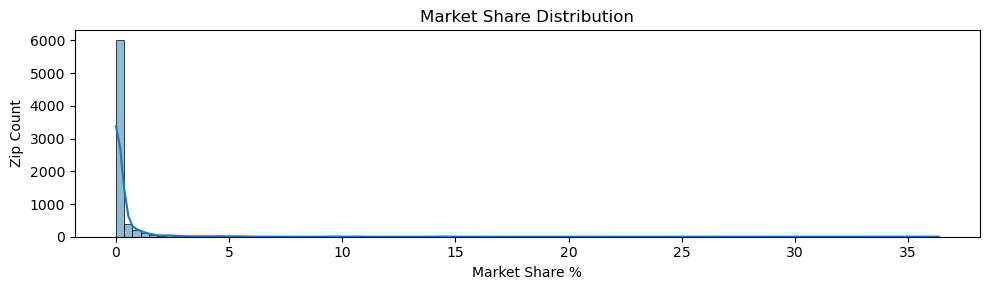

In [28]:
plt.figure(figsize=(10, 3))
sns.histplot(customer_df['Market Share (% of Population)'], bins=100, kde=True)
plt.title("Market Share Distribution")
plt.xlabel("Market Share %")
plt.ylabel("Zip Count")
plt.tight_layout()
plt.show()

<Axes: xlabel='Age', ylabel='Density'>

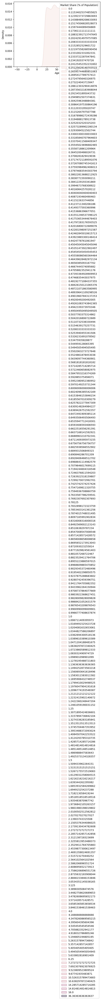

In [222]:
his_plot_df = customer_df.groupby('Age').agg(
    market_share=('Market Share (% of Population)', 'mean'),
).reset_index()

In [224]:
his_plot_df

,Age,market_share
0,19,0.515855
1,20,0.207066
2,21,0.286451
3,22,0.326559
4,23,0.112699
...,...,...
57,76,0.074495
58,77,0.291541
59,78,0.155128
60,79,0.112231


<Axes: xlabel='Age', ylabel='market_share'>

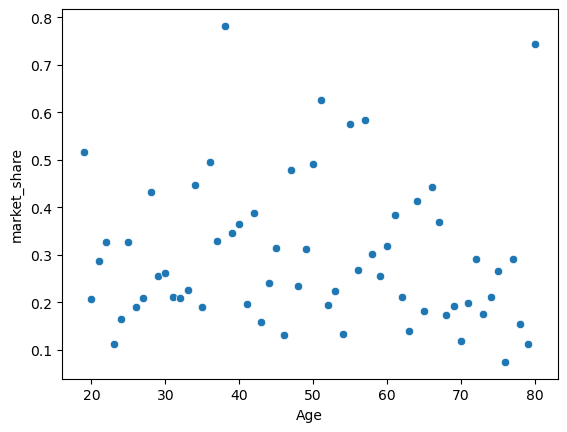

In [232]:
sns.scatterplot(data=his_plot_df, x='Age', y='market_share')

<Axes: xlabel='Market Share (% of Population)', ylabel='Age'>

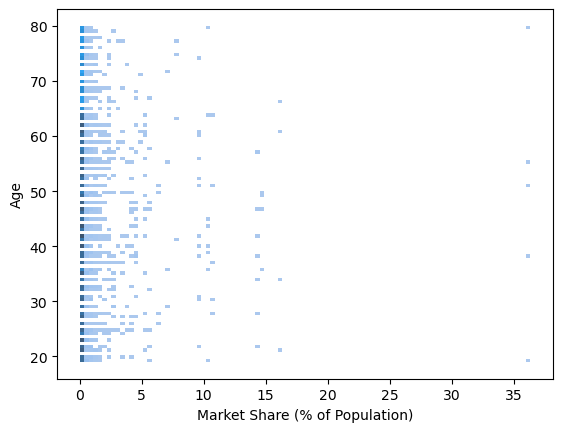

In [29]:
market_share = customer_df['Market Share (% of Population)']

bins_log = [0, 1, 10, 50, 100]
labels_log = ['0 - 1%', '1 - 10%', '10 - 50%', '50 - 100%']

# Use pd.cut to bin the market share into 4 bins with the custom labels
market_share_binned = pd.cut(market_share, bins=bins_log, labels=labels_log)

customer_df['Market Share Bin'] = market_share_binned

In [30]:
customer_df['Market Share Bin'].value_counts()

Market Share Bin
0 - 1%       704
1 - 10%      448
10 - 50%      35
50 - 100%      0
Name: count, dtype: int64

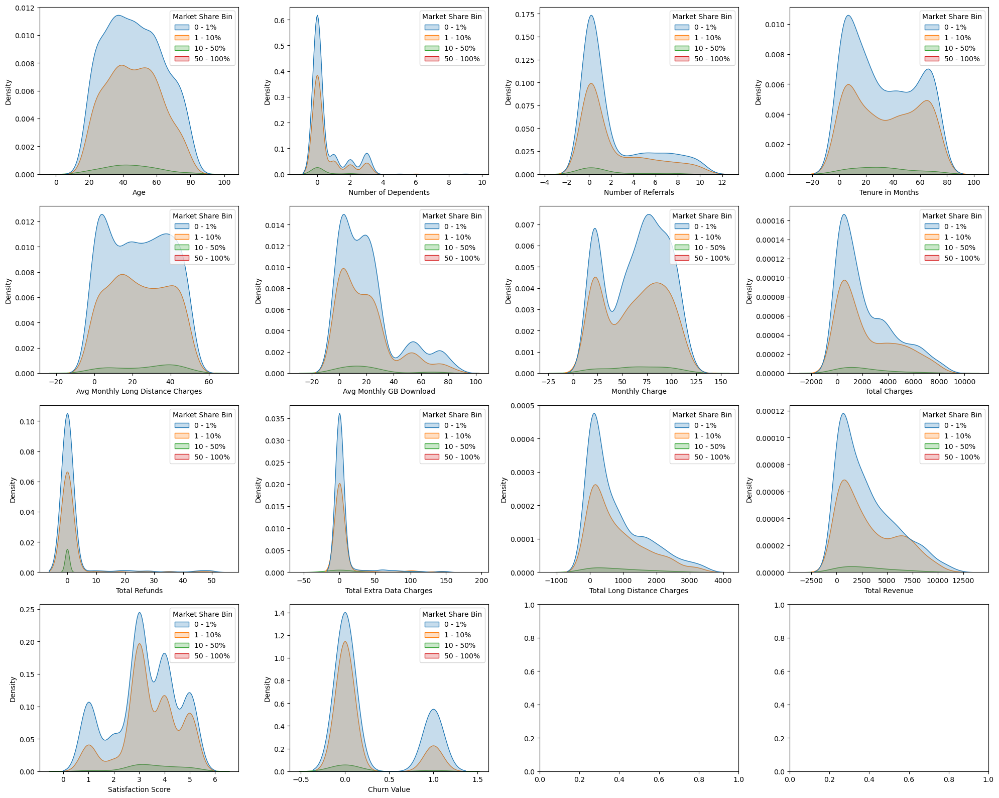

In [31]:
# List of features to plot 
features = ['Age', 'Number of Dependents', 'Number of Referrals',
       'Tenure in Months', 'Avg Monthly Long Distance Charges',
       'Avg Monthly GB Download', 'Monthly Charge', 'Total Charges',
       'Total Refunds', 'Total Extra Data Charges',
       'Total Long Distance Charges', 'Total Revenue', 'Satisfaction Score', 'Churn Value']

# Number of rows and columns in the grid
n_rows = 4 
n_cols = 4

# Create a grid of subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))

axes = axes.flatten()

for i, feature in enumerate(features):
    ax = axes[i]  
    sns.kdeplot(data=customer_df, x=feature, hue='Market Share Bin', fill=True, ax=ax)
    ax.set_xlabel(feature)

plt.tight_layout()
plt.show()

### 4. Create spatial plots of churn rate and market share

In [33]:
customer_df

,Customer ID,Gender,Age,Married,Dependents,Number of Dependents,Referred a Friend,Number of Referrals,Tenure in Months,Offer,Home Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Internet Type,Avg Monthly GB Download,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,State,City,Zip Code,Latitude,Longitude,Satisfaction Score,Customer Status,Churn Value,Churn Category,Churn Reason,Market Share (% of Population),Customer Share (% of Total Customers),Market Share Bin
0,1608-GMEWB,Male,76,No,No,0,No,0,45,Offer B,Yes,15.65,Yes,Yes,Fiber Optic,18,No,No,No,No,Yes,Yes,No,Yes,Two Year,Yes,Bank Withdrawal,93.90,4200.25,0.0,0,704.25,4904.50,California,Stockton,95215,37.946282,-121.139499,4,Stayed,0,NaN,NaN,0.0,0.077310,NaN
1,2817-LVCPP,Female,36,No,No,0,No,0,50,NaN,Yes,12.62,No,No,NaN,0,No,No,No,No,No,No,No,No,Two Year,No,Credit Card,19.40,1023.95,0.0,0,631.00,1654.95,California,Sacramento,95822,38.512569,-121.495184,5,Stayed,0,NaN,NaN,0.0,0.077310,NaN
2,0997-YTLNY,Female,59,No,Yes,2,No,0,19,Offer D,Yes,4.03,No,Yes,Cable,26,No,No,No,Yes,No,No,No,Yes,Month-to-Month,No,Credit Card,48.80,953.65,0.0,0,76.57,1030.22,California,Escondido,92029,33.079834,-117.134275,3,Stayed,0,NaN,NaN,0.0,0.057982,NaN
3,0526-SXDJP,Male,36,Yes,No,0,Yes,7,72,Offer A,No,0.00,No,Yes,Cable,17,Yes,Yes,Yes,No,No,No,No,Yes,Two Year,No,Bank Withdrawal,42.10,2962.00,0.0,0,0.00,2962.00,California,Bell,90201,33.970343,-118.171368,4,Stayed,0,NaN,NaN,0.0,0.096637,NaN
4,3466-RITXD,Male,34,No,No,0,No,0,26,NaN,Yes,37.59,Yes,Yes,Fiber Optic,8,Yes,Yes,No,No,Yes,No,No,Yes,Month-to-Month,Yes,Credit Card,92.40,2349.80,0.0,0,977.34,3327.14,California,Twin Bridges,95735,38.805481,-120.132870,3,Stayed,0,NaN,NaN,16.0,0.077310,10 - 50%
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,3500-NSDOA,Male,35,Yes,No,0,Yes,1,68,NaN,Yes,11.12,Yes,Yes,Cable,10,No,Yes,No,Yes,No,Yes,Yes,Yes,Two Year,No,Credit Card,70.80,4859.95,0.0,0,756.16,5616.11,California,Los Angeles,90008,34.008293,-118.346766,4,Stayed,0,NaN,NaN,0.0,0.096637,NaN
7039,4654-ULTTN,Male,34,Yes,No,0,Yes,9,70,Offer A,Yes,8.28,Yes,Yes,DSL,5,Yes,No,Yes,Yes,No,Yes,Yes,Yes,Two Year,Yes,Credit Card,74.80,5315.80,0.0,0,579.60,5895.40,California,Fillmore,93015,34.408161,-118.865111,3,Stayed,0,NaN,NaN,0.0,0.077310,NaN
7040,1506-YJTYT,Male,21,Yes,Yes,1,Yes,9,45,Offer B,Yes,25.69,Yes,Yes,DSL,26,Yes,Yes,No,Yes,Yes,No,No,Yes,Two Year,No,Credit Card,73.85,3371.00,0.0,0,1156.05,4527.05,California,Oakley,94561,37.999406,-121.686241,3,Stayed,0,NaN,NaN,0.0,0.057982,NaN
7041,1173-NOEYG,Female,25,Yes,No,0,Yes,1,27,NaN,Yes,18.74,Yes,Yes,Fiber Optic,59,No,No,Yes,No,No,Yes,Yes,Yes,Month-to-Month,No,Bank Withdrawal,90.15,2423.40,0.0,0,505.98,2929.38,California,Santa Margarita,93453,35.303926,-120.256567,4,Stayed,0,NaN,NaN,0.0,0.077310,NaN


In [34]:
customer_df['Zip Code'].nunique()

1625

In [35]:
def get_h3_index(lat, lon, resolution=5):
    try:
        return h3.geo_to_h3(lat, lon, resolution)
    except Exception as e:
        print(f"Error converting lat/lon to H3: {e}")
        return None  # Return None if there's an issue

In [36]:
customer_df['H3 Index'] = customer_df.apply(
    lambda row: get_h3_index(row['Latitude'], row['Longitude']), axis=1
)

In [37]:
us_zip_codes_df = customer_df[['Zip Code', 'H3 Index']].drop_duplicates().reset_index(drop=True)

In [38]:
us_zip_codes_df

,Zip Code,H3 Index
0,95215,8528363bfffffff
1,95822,852832b3fffffff
2,92029,8529a473fffffff
3,90201,8529a1d3fffffff
4,95735,85298d2ffffffff
...,...,...
1621,94074,8528343bfffffff
1622,91934,8548592bfffffff
1623,94021,8528343bfffffff
1624,95677,85283217fffffff


In [39]:
churn_by_zip_code = customer_df.groupby('Zip Code').agg(
    total_customers=('Churn Value', 'count'),
    churned_customers=('Churn Value', 'sum')  # Sum gives count of churned customers
).reset_index()

In [40]:
churn_by_zip_code['Churn Rate (%)'] = (churn_by_zip_code['churned_customers'] / churn_by_zip_code['total_customers']) * 100

In [41]:
churn_by_zip_code.head()

,Zip Code,total_customers,churned_customers,Churn Rate (%)
0,90001,4,1,25.0
1,90002,4,0,0.0
2,90003,5,1,20.0
3,90004,5,2,40.0
4,90005,4,2,50.0


In [42]:
churn_by_zip_code.drop(columns=['churned_customers', 'total_customers'], inplace=True)

In [43]:
market_churn_df = us_zip_codes_df.merge(market_share_df, on='Zip Code', how='left')\
               .merge(churn_by_zip_code, on='Zip Code', how='left')

In [44]:
market_churn_df['Churn Rate (%)'] = market_churn_df['Churn Rate (%)'].fillna(0)
market_churn_df['Market Share (% of Population)'] = market_churn_df['Market Share (% of Population)'].fillna(0)
market_churn_df['Customer Share (% of Total Customers)'] = market_churn_df['Customer Share (% of Total Customers)'].fillna(0)

In [45]:
market_churn_df.sort_values(by='Market Share (% of Population)', ascending=False).head()

,Zip Code,H3 Index,Market Share (% of Population),Customer Share (% of Total Customers),Churn Rate (%)
74,90263,8529a197fffffff,36.363636,0.077310,20.0
4,95735,85298d2ffffffff,16.000000,0.077310,0.0
652,95225,85283667fffffff,14.814815,0.077310,0.0
551,95978,852814affffffff,14.285714,0.077310,0.0
1092,90071,8529a1d7fffffff,14.285714,0.057982,40.0


In [46]:
market_churn_df.to_csv('customer_churn_data.csv', index=False)

In [47]:
# Function to convert H3 index to a Shapely Polygon
def h3_to_polygon(h3_index):
    """Convert an H3 index to a Shapely Polygon"""
    boundary = h3.h3_to_geo_boundary(h3_index)  # Returns list of (lat, lon) tuples
    return Polygon([(lon, lat) for lat, lon in boundary])  # Convert to (lon, lat) for Shapely

# Convert H3 indices to polygons and create a GeoDataFrame
df = market_churn_df.copy()
df['geometry'] = df['H3 Index'].apply(h3_to_polygon)
gdf = gpd.GeoDataFrame(df, geometry='geometry')

# Compute centroid dynamically for better positioning
centroid = gdf.geometry.unary_union.centroid

# Create base map
leaflet_map = folium.Map(location=[centroid.y, centroid.x], zoom_start=6, tiles="CartoDB Positron")

# Define colormaps
churn_colormap = linear.Reds_09.scale(df['Churn Rate (%)'].min(), df['Churn Rate (%)'].max())
market_share_colormap = linear.Greens_09.scale(df['Market Share (% of Population)'].min(), df['Market Share (% of Population)'].max())

# Add Churn Rate Layer
churn_layer = folium.FeatureGroup(name="Churn Rate (%)", show=True)
for _, row in gdf.iterrows():
    folium.GeoJson(
        row['geometry'],
        style_function=lambda x, rate=row['Churn Rate (%)']: {
            'fillColor': churn_colormap(rate),
            'color': '#222222',
            'weight': 1,
            'fillOpacity': 0.75
        },
        tooltip=folium.Tooltip(f"<b>Churn Rate:</b> {row['Churn Rate (%)']:.2f}%<br><b>Market Share:</b> {row['Market Share (% of Population)']:.2f}%")
    ).add_to(churn_layer)
churn_layer.add_to(leaflet_map)

# Add Market Share Layer
market_layer = folium.FeatureGroup(name="Market Share (%)", show=False)
for _, row in gdf.iterrows():
    folium.GeoJson(
        row['geometry'],
        style_function=lambda x, rate=row['Market Share (% of Population)']: {
            'fillColor': market_share_colormap(rate),
            'color': '#222222',
            'weight': 1,
            'fillOpacity': 0.75
        },
        tooltip=folium.Tooltip(f"<b>Churn Rate:</b> {row['Churn Rate (%)']:.2f}%<br><b>Market Share:</b> {row['Market Share (% of Population)']:.2f}%")
    ).add_to(market_layer)
market_layer.add_to(leaflet_map)

# Add colormaps as legends
churn_colormap.caption = "Churn Rate (%)"
churn_colormap.add_to(leaflet_map)

market_share_colormap.caption = "Market Share (%)"
market_share_colormap.add_to(leaflet_map)

# Add Layer Control to switch between layers
folium.LayerControl(collapsed=False).add_to(leaflet_map)

# Save map as HTML
leaflet_map.save('churn_market_share_map.html')

leaflet_map

### 5. Generate a customer churn risk value based on the available columns

In [49]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score

In [50]:
customer_df.dtypes

Customer ID                                object
Gender                                     object
Age                                         int64
Married                                    object
Dependents                                 object
Number of Dependents                        int64
Referred a Friend                          object
Number of Referrals                         int64
Tenure in Months                            int64
Offer                                      object
Home Phone Service                         object
Avg Monthly Long Distance Charges         float64
Multiple Lines                             object
Internet Service                           object
Internet Type                              object
Avg Monthly GB Download                     int64
Online Security                            object
Online Backup                              object
Device Protection Plan                     object
Premium Tech Support                       object


In [51]:
# drop columns to reduce noise and data lekage 
churn_df = customer_df.drop(columns=[ 'Customer ID','Customer Status', 'Churn Category', 'Churn Reason', 'Latitude', 'Longitude', 'Market Share Bin', 'H3 Index'])

In [52]:
numerical_cols = churn_df.select_dtypes(include=[np.number]).columns
print("Continuous Columns:", numerical_cols)

Continuous Columns: Index(['Age', 'Number of Dependents', 'Number of Referrals',
       'Tenure in Months', 'Avg Monthly Long Distance Charges',
       'Avg Monthly GB Download', 'Monthly Charge', 'Total Charges',
       'Total Refunds', 'Total Extra Data Charges',
       'Total Long Distance Charges', 'Total Revenue', 'Zip Code',
       'Satisfaction Score', 'Churn Value', 'Market Share (% of Population)',
       'Customer Share (% of Total Customers)'],
      dtype='object')


In [53]:
categorical_cols = churn_df.select_dtypes(include=['object', 'category', 'bool']).columns
print("Categorical Columns:", categorical_cols)

Categorical Columns: Index(['Gender', 'Married', 'Dependents', 'Referred a Friend', 'Offer',
       'Home Phone Service', 'Multiple Lines', 'Internet Service',
       'Internet Type', 'Online Security', 'Online Backup',
       'Device Protection Plan', 'Premium Tech Support', 'Streaming TV',
       'Streaming Movies', 'Streaming Music', 'Unlimited Data', 'Contract',
       'Paperless Billing', 'Payment Method', 'State', 'City'],
      dtype='object')


In [54]:
churn_df['Churn Value'].value_counts()/len(churn_df) * 100

Churn Value
0    73.463013
1    26.536987
Name: count, dtype: float64

In [55]:
churn_df.describe()

,Age,Number of Dependents,Number of Referrals,Tenure in Months,Avg Monthly Long Distance Charges,Avg Monthly GB Download,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Zip Code,Satisfaction Score,Churn Value,Market Share (% of Population),Customer Share (% of Total Customers)
count,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000
mean,46.509726,0.468692,1.951867,32.386767,22.958954,20.515405,64.761692,2280.381264,1.962182,6.860713,749.099262,3034.379056,93486.071134,3.244924,0.265370,0.303195,0.066261
std,16.750352,0.962802,3.001199,24.542061,15.448113,20.418940,30.090047,2266.220462,7.902614,25.104978,846.660055,2865.204542,1856.768045,1.201657,0.441561,1.513353,0.040936
min,19.000000,0.000000,0.000000,1.000000,0.000000,0.000000,18.250000,18.800000,0.000000,0.000000,0.000000,21.360000,90001.000000,1.000000,0.000000,0.000000,0.000000
25%,32.000000,0.000000,0.000000,9.000000,9.210000,3.000000,35.500000,400.150000,0.000000,0.000000,70.545000,605.610000,92101.000000,3.000000,0.000000,0.000000,0.057982
50%,46.000000,0.000000,0.000000,29.000000,22.890000,17.000000,70.350000,1394.550000,0.000000,0.000000,401.440000,2108.640000,93518.000000,3.000000,0.000000,0.000000,0.057982
75%,60.000000,0.000000,3.000000,55.000000,36.395000,27.000000,89.850000,3786.600000,0.000000,0.000000,1191.100000,4801.145000,95329.000000,4.000000,1.000000,0.000000,0.077310
max,80.000000,9.000000,11.000000,72.000000,49.990000,85.000000,118.750000,8684.800000,49.790000,150.000000,3564.720000,11979.340000,96150.000000,5.000000,1.000000,36.363636,0.444530


<Axes: >

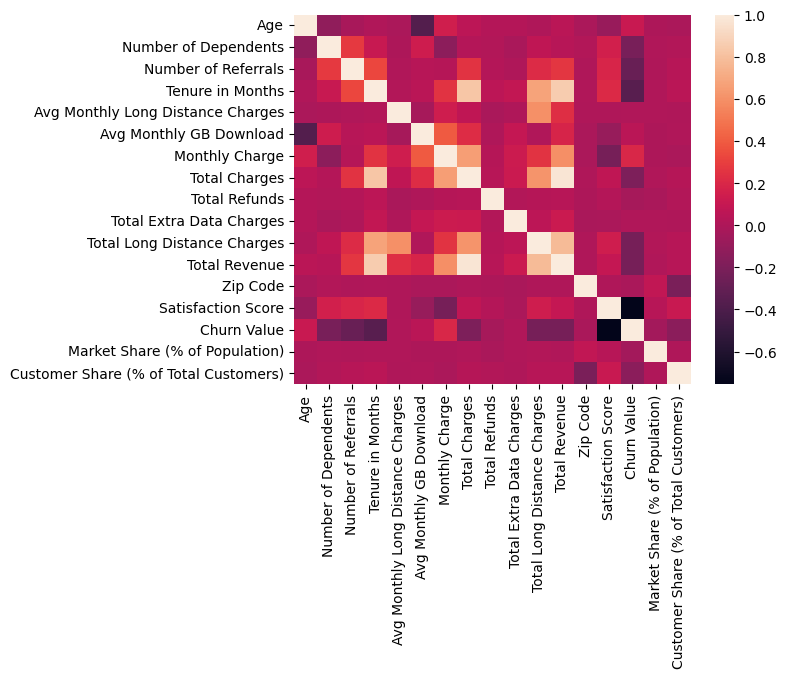

In [56]:
sns.heatmap(churn_df.corr(numeric_only=True))

In [57]:
# data pre processing 

In [58]:
# Encode categorical variables
churn_df = pd.get_dummies(churn_df, drop_first=True)

In [59]:
churn_df

Age  Number of Dependents  Number of Referrals  Tenure in Months  \
0      76                     0                    0                45   
1      36                     0                    0                50   
2      59                     2                    0                19   
3      36                     0                    7                72   
4      34                     0                    0                26   
...   ...                   ...                  ...               ...   
7038   35                     0                    1                68   
7039   34                     0                    9                70   
7040   21                     1                    9                45   
7041   25                     0                    1                27   
7042   58                     0                    1                50   

      Avg Monthly Long Distance Charges  Avg Monthly GB Download  \
0                                 15.65                       18   
1                                 12.62                        0   
2                                  4.03                       26   
3                                  0.00                       17   
4                                 37.59                        8   
...                                 ...                      ...   
7038                              11.12                       10   
7039                               8.28                        5   
7040                              25.69                       26   
7041                              18.74                       59   
7042                              29.43                       14   

      Monthly Charge  Total Charges  Total Refunds  Total Extra Data Charges  \
0              93.90        4200.25            0.0                         0   
1              19.40        1023.95            0.0                         0   
2              48.80         953.65            0.0                         0   
3              42.10        2962.00            0.0                         0   
4              92.40        2349.80            0.0                         0   
...              ...            ...            ...                       ...   
7038           70.80        4859.95            0.0                         0   
7039           74.80        5315.80            0.0                         0   
7040           73.85        3371.00            0.0                         0   
7041           90.15        2423.40            0.0                         0   
7042          108.55        5610.70            0.0                         0   

      Total Long Distance Charges  Total Revenue  Zip Code  \
0                          704.25        4904.50     95215   
1                          631.00        1654.95     95822   
2                           76.57        1030.22     92029   
3                            0.00        2962.00     90201   
4                          977.34        3327.14     95735   
...                           ...            ...       ...   
7038                       756.16        5616.11     90008   
7039                       579.60        5895.40     93015   
7040                      1156.05        4527.05     94561   
7041                       505.98        2929.38     93453   
7042                      1471.50        7082.20     93667   

      Satisfaction Score  Churn Value  Market Share (% of Population)  \
0                      4            0                             0.0   
1                      5            0                             0.0   
2                      3            0                             0.0   
3                      4            0                             0.0   
4                      3            0                            16.0   
...                  ...          ...                             ...   
7038                   4            0                             0.0   
7039      

In [60]:
# Split data into features (X) and target (y)
X = churn_df.drop('Churn Value', axis=1)
y = churn_df['Churn Value']

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [61]:
train_df = pd.DataFrame(X_train)
train_df['Churn Value'] = y_train

In [62]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [63]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'n_estimators': [100, 200, 300], # Number of trees in the forest
    'max_depth': [10, 20, 30], 
    'min_samples_leaf': [1, 2, 4]
}

In [64]:
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2, scoring='precision')

In [65]:
# Fit GridSearchCV on the training data
grid_search.fit(X_train, y_train)

# Get the best parameters and the best model
best_params = grid_search.best_params_
best_rf_model = grid_search.best_estimator_

print(f"Best Hyperparameters: {best_params}")

Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best Hyperparameters: {'max_depth': 10, 'min_samples_leaf': 4, 'n_estimators': 300}


In [66]:
y_pred = best_rf_model.predict(X_test)

### Model Evaluation - Create metrics to understand your model's performance

In [68]:
# Random Forest Performance
y_pred_rf = best_rf_model.predict(X_test)
print('Random Forest Performance:')
print(classification_report(y_test, y_pred_rf))

Random Forest Performance:
              precision    recall  f1-score   support

           0       0.83      1.00      0.91      1021
           1       0.99      0.48      0.65       388

    accuracy                           0.86      1409
   macro avg       0.91      0.74      0.78      1409
weighted avg       0.88      0.86      0.84      1409



In [69]:
cm = confusion_matrix(y_test, y_pred)
TN, FP, FN, TP = cm.ravel()

In [70]:
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Positives (TP): {TP}")

True Negatives (TN): 1019
False Positives (FP): 2
False Negatives (FN): 202
True Positives (TP): 186


In [71]:
# Feature Importance from Random Forest
feature_importances = pd.DataFrame(rf_model.feature_importances_, index=X.columns, columns=['importance']).sort_values('importance', ascending=False)
feature_importances.head(10)

,importance
Satisfaction Score,0.259821
Customer Share (% of Total Customers),0.053492
Tenure in Months,0.046811
Monthly Charge,0.040312
Total Charges,0.037422
Total Revenue,0.036452
Total Long Distance Charges,0.034581
Number of Referrals,0.034178
Contract_Two Year,0.028117
Avg Monthly GB Download,0.027535


In [72]:
import shap
explainer = shap.TreeExplainer(best_rf_model)
shap_values = explainer.shap_values(X_test)

In [73]:
shap_values_class_1 = shap_values[:, :, 1]

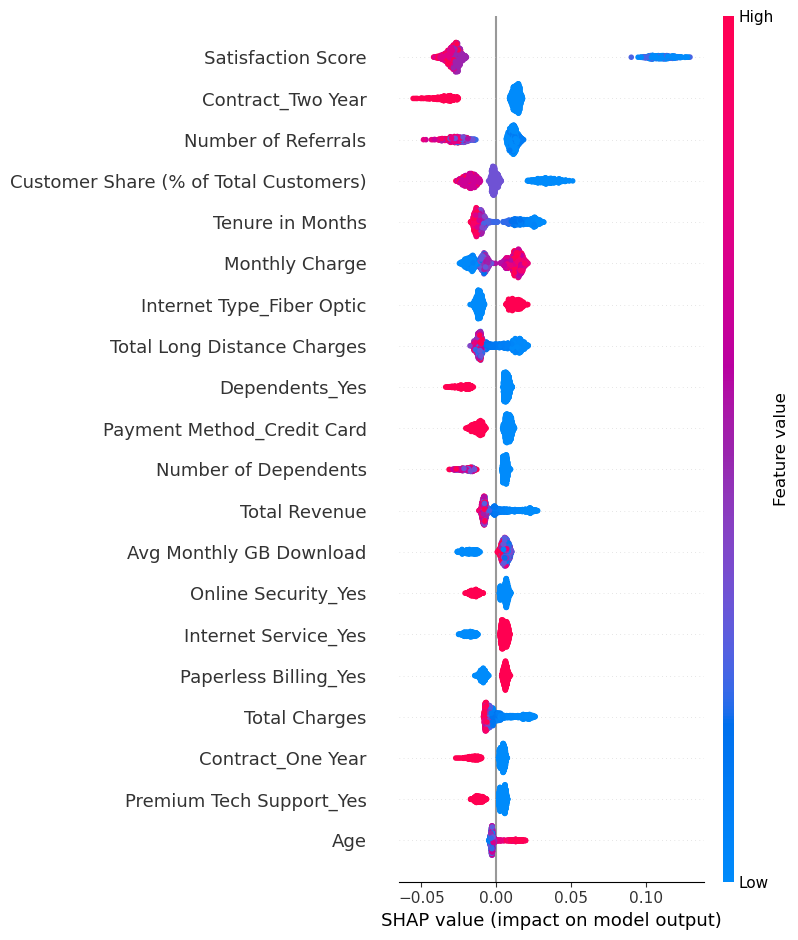

In [74]:
shap.summary_plot(shap_values_class_1, X_test)

In [75]:
# generate customer churn risk value for all customers and save to a file

In [76]:
curn_risk_df = customer_df.drop(columns=[ 'Customer ID','Customer Status', 'Churn Category', 'Churn Value', 'Churn Reason', 'Latitude', 'Longitude', 'Market Share Bin', 'H3 Index'])
curn_risk_df = pd.get_dummies(curn_risk_df, drop_first=True)

In [77]:
y_pred_rf = best_rf_model.predict_proba(curn_risk_df)

In [78]:
customer_df['Churn Risk'] = y_pred_rf[:, 1]

In [79]:
customer_df[['Customer ID', 'Churn Risk']].to_csv('customer_churn_risk_score.csv', index=False)

In [80]:
customer_df[customer_df['Churn Risk'] > 0.5]

,Customer ID,Gender,Age,Married,Dependents,Number of Dependents,Referred a Friend,Number of Referrals,Tenure in Months,Offer,Home Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Internet Type,Avg Monthly GB Download,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,State,City,Zip Code,Latitude,Longitude,Satisfaction Score,Customer Status,Churn Value,Churn Category,Churn Reason,Market Share (% of Population),Customer Share (% of Total Customers),Market Share Bin,H3 Index,Churn Risk
7,8824-RWFXJ,Male,21,Yes,No,0,Yes,1,3,Offer E,Yes,29.29,No,Yes,Cable,52,No,Yes,Yes,No,No,No,Yes,Yes,Month-to-Month,Yes,Mailed Check,56.15,168.15,0.00,0,87.87,256.02,California,Santa Cruz,95062,36.974575,-121.991149,1,Churned,1,Competitor,Competitor had better devices,0.0,0.057982,NaN,8528341bfffffff,0.523122
11,5394-SVGJV,Male,27,No,No,0,No,0,37,NaN,Yes,30.72,Yes,Yes,Fiber Optic,42,No,No,No,Yes,Yes,Yes,Yes,Yes,Month-to-Month,No,Bank Withdrawal,98.80,3475.55,0.00,0,1136.64,4612.19,California,Sacramento,95838,38.646096,-121.442433,1,Churned,1,Competitor,Competitor made better offer,0.0,0.019327,NaN,852832bbfffffff,0.509149
12,2357-COQEK,Female,79,No,No,0,No,0,28,NaN,Yes,28.14,Yes,Yes,Fiber Optic,10,No,No,Yes,Yes,Yes,Yes,No,Yes,Month-to-Month,Yes,Bank Withdrawal,103.30,2890.65,0.00,0,787.92,3678.57,California,Atherton,94027,37.454924,-122.203168,2,Churned,1,Competitor,Competitor made better offer,0.0,0.038655,NaN,85283477fffffff,0.516793
14,4795-KTRTH,Female,68,Yes,No,0,Yes,1,5,Offer E,Yes,47.28,Yes,Yes,Fiber Optic,11,No,Yes,No,No,No,No,No,No,Month-to-Month,Yes,Bank Withdrawal,81.00,371.65,40.64,10,236.40,577.41,California,San Diego,92122,32.857230,-117.209774,1,Churned,1,Competitor,Competitor made better offer,0.0,0.057982,NaN,8529a403fffffff,0.579694
15,2359-KMGLI,Male,52,No,No,0,No,0,24,Offer C,Yes,49.30,Yes,Yes,Fiber Optic,20,No,Yes,No,No,No,No,No,Yes,Month-to-Month,Yes,Bank Withdrawal,80.25,1861.50,0.00,0,1183.20,3044.70,California,Running Springs,92382,34.186211,-117.076830,1,Churned,1,Competitor,Competitor had better devices,0.0,0.019327,NaN,8529a073fffffff,0.501785
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6986,2840-XANRC,Male,77,Yes,No,0,Yes,1,24,Offer C,Yes,16.10,No,Yes,Cable,12,No,No,Yes,No,Yes,Yes,Yes,Yes,Month-to-Month,Yes,Bank Withdrawal,93.15,2231.05,0.00,0,386.40,2617.45,California,San Diego,92122,32.857230,-117.209774,2,Churned,1,Competitor,Competitor made better offer,0.0,0.057982,NaN,8529a403fffffff,0.545977
6993,9846-GKXAS,Female,53,No,No,0,No,0,9,Offer E,Yes,1.34,No,Yes,Fiber Optic,9,No,No,No,No,Yes,Yes,Yes,Yes,Month-to-Month,Yes,Bank Withdrawal,90.80,809.75,0.00,0,12.06,821.81,California,Burlingame,94010,37.570280,-122.365778,3,Churned,1,Attitude,Attitude of support person,0.0,0.038655,NaN,85283093fffffff,0.500467
7006,7851-WZEKY,Female,32,No,No,0,No,0,2,Offer E,Yes,38.51,Yes,Yes,Fiber Optic,25,No,No,No,No,Yes,Yes,Yes,Yes,Month-to-Month,Yes,Bank Withdrawal,95.15,196.90,0.00,0,77.02,273.92,California,Stockton,95219,38.029729,-121.387999,2,Churned,1,Competitor,Competitor made better offer,0.0,0.057982,NaN,85283623fffffff,0.623031
7032,6235-VDHOM,Female,77,No,No,0,No,0,5,Offer E,No,0.00,No,Yes,DSL,26,No,Yes,No,No,No,No,No,Yes,Month-to-Month,No,Bank Withdrawal,28.45,131.05,0.00,0,0.00,131.05,California,Riverside,92509,34.004379,-117.447864,2,Churned,1,Dissatisfaction,Limited range of services,0.0,0.038655,NaN,8529a007fffffff,0.508287


### 6. Predict market share per zip code based on the available columns

In [82]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error

In [83]:
customer_df.head()

,Customer ID,Gender,Age,Married,Dependents,Number of Dependents,Referred a Friend,Number of Referrals,Tenure in Months,Offer,Home Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Internet Type,Avg Monthly GB Download,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,State,City,Zip Code,Latitude,Longitude,Satisfaction Score,Customer Status,Churn Value,Churn Category,Churn Reason,Market Share (% of Population),Customer Share (% of Total Customers),Market Share Bin,H3 Index,Churn Risk
0,1608-GMEWB,Male,76,No,No,0,No,0,45,Offer B,Yes,15.65,Yes,Yes,Fiber Optic,18,No,No,No,No,Yes,Yes,No,Yes,Two Year,Yes,Bank Withdrawal,93.9,4200.25,0.0,0,704.25,4904.50,California,Stockton,95215,37.946282,-121.139499,4,Stayed,0,NaN,NaN,0.0,0.077310,NaN,8528363bfffffff,0.240161
1,2817-LVCPP,Female,36,No,No,0,No,0,50,NaN,Yes,12.62,No,No,NaN,0,No,No,No,No,No,No,No,No,Two Year,No,Credit Card,19.4,1023.95,0.0,0,631.00,1654.95,California,Sacramento,95822,38.512569,-121.495184,5,Stayed,0,NaN,NaN,0.0,0.077310,NaN,852832b3fffffff,0.083341
2,0997-YTLNY,Female,59,No,Yes,2,No,0,19,Offer D,Yes,4.03,No,Yes,Cable,26,No,No,No,Yes,No,No,No,Yes,Month-to-Month,No,Credit Card,48.8,953.65,0.0,0,76.57,1030.22,California,Escondido,92029,33.079834,-117.134275,3,Stayed,0,NaN,NaN,0.0,0.057982,NaN,8529a473fffffff,0.184225
3,0526-SXDJP,Male,36,Yes,No,0,Yes,7,72,Offer A,No,0.00,No,Yes,Cable,17,Yes,Yes,Yes,No,No,No,No,Yes,Two Year,No,Bank Withdrawal,42.1,2962.00,0.0,0,0.00,2962.00,California,Bell,90201,33.970343,-118.171368,4,Stayed,0,NaN,NaN,0.0,0.096637,NaN,8529a1d3fffffff,0.118009
4,3466-RITXD,Male,34,No,No,0,No,0,26,NaN,Yes,37.59,Yes,Yes,Fiber Optic,8,Yes,Yes,No,No,Yes,No,No,Yes,Month-to-Month,Yes,Credit Card,92.4,2349.80,0.0,0,977.34,3327.14,California,Twin Bridges,95735,38.805481,-120.132870,3,Stayed,0,NaN,NaN,16.0,0.077310,10 - 50%,85298d2ffffffff,0.224106


In [84]:
numerical_cols_list = list(numerical_cols) 
zip_features = [col for col in numerical_cols_list if col not in [
    'Zip Code', 
    'Market Share (% of Population)', 
    'Customer Share (% of Total Customers)'
]]

In [85]:
zip_features

['Age',
 'Number of Dependents',
 'Number of Referrals',
 'Tenure in Months',
 'Avg Monthly Long Distance Charges',
 'Avg Monthly GB Download',
 'Monthly Charge',
 'Total Charges',
 'Total Refunds',
 'Total Extra Data Charges',
 'Total Long Distance Charges',
 'Total Revenue',
 'Satisfaction Score',
 'Churn Value']

In [86]:
zip_code_df = customer_df.groupby('Zip Code')[zip_features].mean().reset_index()
zip_code_df.rename(columns={col: f'avg_{col}' for col in zip_features}, inplace=True)

In [87]:
zip_code_df.head()

,Zip Code,avg_Age,avg_Number of Dependents,avg_Number of Referrals,avg_Tenure in Months,avg_Avg Monthly Long Distance Charges,avg_Avg Monthly GB Download,avg_Monthly Charge,avg_Total Charges,avg_Total Refunds,avg_Total Extra Data Charges,avg_Total Long Distance Charges,avg_Total Revenue,avg_Satisfaction Score,avg_Churn Value
0,90001,52.25,0.0,0.50,23.75,5.9050,11.25,67.1625,2249.9500,0.000,0.0,327.9925,2577.9425,3.0,0.25
1,90002,50.25,0.0,2.25,35.75,32.4125,7.25,48.2125,1745.0250,11.455,0.0,1014.7350,2748.3050,4.0,0.00
2,90003,46.20,0.6,3.00,14.00,20.3920,14.00,65.5000,1272.8900,0.000,0.0,230.1620,1503.0520,2.6,0.20
3,90004,39.40,0.8,2.40,25.20,18.6380,31.40,51.0900,1564.8300,0.000,8.0,325.9780,1898.8080,3.0,0.40
4,90005,42.25,0.5,2.25,30.00,19.3075,20.25,70.6000,2569.3625,0.000,15.0,449.3675,3033.7300,3.0,0.50


In [88]:
zip_code_df = zip_code_df.merge(market_share_df, on='Zip Code', how='left')

In [89]:
zip_code_df

,Zip Code,avg_Age,avg_Number of Dependents,avg_Number of Referrals,avg_Tenure in Months,avg_Avg Monthly Long Distance Charges,avg_Avg Monthly GB Download,avg_Monthly Charge,avg_Total Charges,avg_Total Refunds,avg_Total Extra Data Charges,avg_Total Long Distance Charges,avg_Total Revenue,avg_Satisfaction Score,avg_Churn Value,Market Share (% of Population),Customer Share (% of Total Customers)
0,90001,52.250000,0.00,0.500000,23.75,5.9050,11.250000,67.162500,2249.950000,0.0000,0.0,327.9925,2577.942500,3.00,0.25,0.000000,0.057982
1,90002,50.250000,0.00,2.250000,35.75,32.4125,7.250000,48.212500,1745.025000,11.4550,0.0,1014.7350,2748.305000,4.00,0.00,0.000000,0.077310
2,90003,46.200000,0.60,3.000000,14.00,20.3920,14.000000,65.500000,1272.890000,0.0000,0.0,230.1620,1503.052000,2.60,0.20,0.000000,0.077310
3,90004,39.400000,0.80,2.400000,25.20,18.6380,31.400000,51.090000,1564.830000,0.0000,8.0,325.9780,1898.808000,3.00,0.40,0.000000,0.057982
4,90005,42.250000,0.50,2.250000,30.00,19.3075,20.250000,70.600000,2569.362500,0.0000,15.0,449.3675,3033.730000,3.00,0.50,0.000000,0.038655
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1620,96143,49.000000,0.50,2.750000,26.75,22.8800,15.500000,68.387500,2041.350000,0.0000,0.0,555.5375,2596.887500,3.50,0.25,0.000000,0.057982
1621,96145,53.333333,0.00,3.333333,37.00,30.5200,8.666667,89.366667,3791.066667,0.0000,0.0,1199.0900,4990.156667,3.00,0.00,0.000000,0.057982
1622,96146,44.000000,1.25,3.750000,24.25,25.0150,11.250000,61.437500,1431.762500,12.3825,2.5,534.4650,1956.345000,3.75,0.00,0.424628,0.077310
1623,96148,49.000000,0.00,0.000000,30.75,18.0175,22.000000,64.012500,2373.812500,0.0000,0.0,292.8275,2666.640000,2.75,0.50,0.294985,0.038655


In [90]:
zip_code_df.isna().sum()

Zip Code                                  0
avg_Age                                   0
avg_Number of Dependents                  0
avg_Number of Referrals                   0
avg_Tenure in Months                      0
avg_Avg Monthly Long Distance Charges     0
avg_Avg Monthly GB Download               0
avg_Monthly Charge                        0
avg_Total Charges                         0
avg_Total Refunds                         0
avg_Total Extra Data Charges              0
avg_Total Long Distance Charges           0
avg_Total Revenue                         0
avg_Satisfaction Score                    0
avg_Churn Value                           0
Market Share (% of Population)           11
Customer Share (% of Total Customers)    11
dtype: int64

In [91]:
zip_code_df['Market Share (% of Population)'] = zip_code_df['Market Share (% of Population)'].fillna(0)
zip_code_df['Customer Share (% of Total Customers)'] = zip_code_df['Customer Share (% of Total Customers)'].fillna(0)

In [92]:
zip_code_df['Market Share (% of Population)'].describe()

count    1625.000000
mean        0.318063
std         1.488951
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max        36.363636
Name: Market Share (% of Population), dtype: float64

In [93]:
# Split data into features (X) and target (y)
X = zip_code_df.drop('Market Share (% of Population)', axis=1)
y = zip_code_df['Market Share (% of Population)']

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [94]:
train_df = pd.DataFrame(X_train)
train_df['Market Share (% of Population)'] = y_train

In [95]:
regressor = DecisionTreeRegressor(random_state=42)

# Train the model
regressor.fit(X_train, y_train)

DecisionTreeRegressor(random_state=42)

In [96]:
y_pred = regressor.predict(X_test)

# Calculate Mean Squared Error
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

Mean Squared Error: 6.8193489965431136


In [95]:
# save results to a file 

In [188]:
zip_data = zip_code_df.drop(columns=['Market Share (% of Population)'])

In [190]:
market_share_pred = regressor.predict(zip_data)

In [192]:
zip_data['Market Share Pred'] = market_share_pred

In [194]:
zip_data[['Zip Code', 'Market Share Pred']].to_csv('market_share_prediction.csv', index=False)

In [195]:
zip_data[['Zip Code', 'Market Share Pred']]

,Zip Code,Market Share Pred
0,90001,0.000000
1,90002,0.000000
2,90003,0.000000
3,90004,0.000000
4,90005,0.000000
...,...,...
1620,96143,0.000000
1621,96145,0.000000
1622,96146,0.424628
1623,96148,0.294985


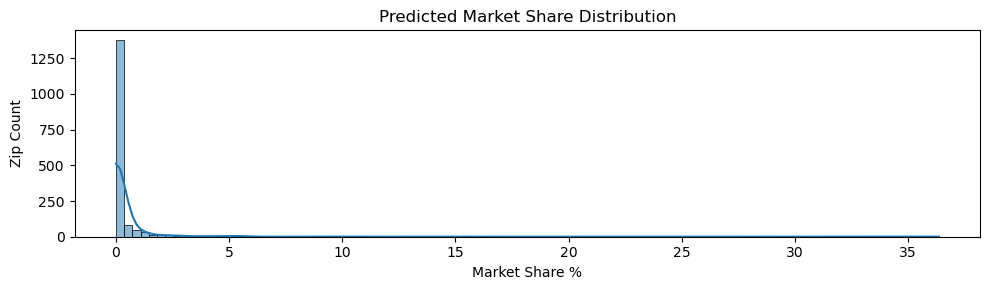

In [210]:
plt.figure(figsize=(10, 3))
sns.histplot(zip_data['Market Share Pred'], bins=100, kde=True)
plt.title("Predicted Market Share Distribution")
plt.xlabel("Market Share %")
plt.ylabel("Zip Count")
plt.tight_layout()
plt.show()

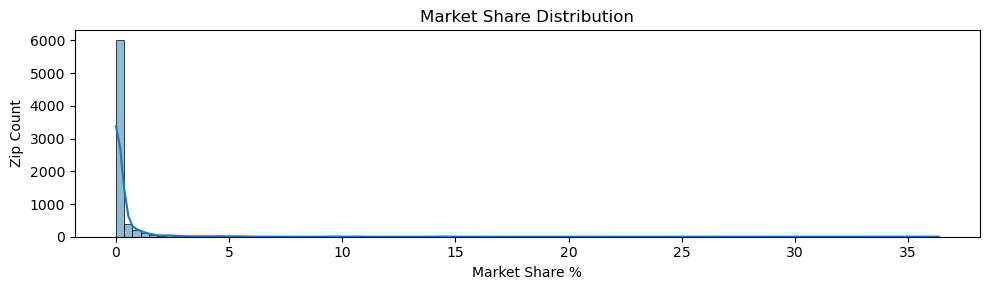

In [208]:
plt.figure(figsize=(10, 3))
sns.histplot(customer_df['Market Share (% of Population)'], bins=100, kde=True)
plt.title("Market Share Distribution")
plt.xlabel("Market Share %")
plt.ylabel("Zip Count")
plt.tight_layout()
plt.show()